**Data Exploratory Notebook**

This notebook presents an exploratory data analysis (EDA) of the New York City Taxi Trip dataset, focusing on both trip and fare components. The primary goal is to examine the structure, quality, and underlying characteristics of the data before proceeding with downstream modeling or data validation pipelines.

**Data**

The datasets analyzed are:

- trip_data_1.csv — contains trip-level attributes such as pickup and dropoff coordinates, timestamps, passenger count, and trip distances.
- trip_fare_1.csv — includes corresponding fare-related details such as fare amount, payment type, surcharge, taxes, and tips.

**Objectives**

1. Understand the data structure — Review schema, column definitions, data types, and field relationships between trip and fare datasets.
2. Assess data quality — Identify missing values, inconsistencies, outliers, and potential data integrity issues.
3. Perform initial descriptive analysis — Explore summary statistics and feature distributions to uncover early insights into taxi trip behavior.
4. Support downstream validation — Prepare the data and initial metrics for integration with the automated quality testing pipeline implemented using Great Expectations.


**Table of contents**<a id='toc0_'></a>    
- [**Loading Data Sample**](#toc1_)    
- [**Data Profiling**](#toc2_)    
  - [**Data Field Overview**](#toc2_1_)    
    - [Trip Fare Dataset](#toc2_1_1_)    
    - [Trip Data Features](#toc2_1_2_)    
  - [**Data Field Transformations**](#toc2_2_)    
  - [**Data Profiling**](#toc2_3_)    
    - [**Missing Values**](#toc2_3_1_)    
    - [**Outlier Detection**](#toc2_3_2_)    
    - [**Coordinate Sanity Map - NYC Bounds Checks**](#toc2_3_3_)    
    - [**Correlation Heatmap - Relationship between numerical fields**](#toc2_3_4_)    
- [**Data Quality Framework Overview**](#toc3_)    
  - [**Data Validation Rules & Thresholds**](#toc3_1_)    
    - [**Statistical Summary**](#toc3_1_1_)    
    - [**Logical Consistency Checks**](#toc3_1_2_)    
    - [**Causal & Cross-Feature Dependencies**](#toc3_1_3_)    
  - [**Validation Summary & Reporting**](#toc3_2_)    
    - [**Data Quality Scoring Framework**](#toc3_2_1_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[**Loading Data Sample**](#toc0_)


In [41]:
import pandas as pd
from pathlib import Path

dir_path = Path("data")
trip_data = dir_path / "input" / "trip_data"
trip_fare = dir_path / "input" / "trip_fare"

assert dir_path.exists() and dir_path.is_dir(), f"Path does not exist. {dir_path}"
assert trip_data.is_dir() and trip_fare.is_dir(), f"Both dir paths must exist. May need to reset the workspace. Current trip data path: {trip_data} and trip fare path: {trip_fare}"

sample_data_path = sorted(list(trip_data.glob("*.csv")))[0]
sample_data_fare_path = sorted(list(trip_fare.glob("*.csv")))[0]

fare = pd.read_csv(sample_data_fare_path)
data = pd.read_csv(sample_data_path)

print(f"loading trip data & fare from paths {sample_data_path} & {sample_data_fare_path} respectively.")

loading trip data & fare from paths data/input/trip_data/trip_data_1.csv & data/input/trip_fare/trip_fare_1.csv respectively.


# <a id='toc2_'></a>[**Data Profiling**](#toc0_)

This section contains:

- Data Field Summary
- Data Schema


## <a id='toc2_1_'></a>[**Data Field Overview**](#toc0_)


### <a id='toc2_1_1_'></a>[Trip Fare Dataset](#toc0_)


| Field Name      | Data Type | Description                                                                             |
| --------------- | --------- | --------------------------------------------------------------------------------------- |
| medallion       | object    | Unique identifier for the taxi (medallion number assigned to each licensed cab).        |
| hack_license    | object    | Unique identifier for the driver’s hack license.                                        |
| vendor_id       | object    | Code indicating the vendor or technology provider (e.g., CMT, VTS).                     |
| pickup_datetime | object    | Date and time when the passenger was picked up (ISO or string timestamp format).        |
| payment_type    | object    | Type of payment used (e.g., Cash, Credit card, No charge, Dispute).                     |
| fare_amount     | float64   | Base fare charged for the trip (excluding surcharges and tips).                         |
| surcharge       | float64   | Additional charge (e.g., night-time surcharge or rush hour fee).                        |
| mta_tax         | float64   | Tax imposed by the Metropolitan Transportation Authority.                               |
| tip_amount      | float64   | Tip paid by the passenger (typically applicable for credit card transactions).          |
| tolls_amount    | float64   | Total tolls charged for bridges, tunnels, etc., during the trip.                        |
| total_amount    | float64   | Total fare paid by the passenger, inclusive of all components (fare, tax, tolls, tips). |


### <a id='toc2_1_2_'></a>[Trip Data Features](#toc0_)


| Field Name         | Data Type | Description                                                                                                                                              |
| ------------------ | --------- | -------------------------------------------------------------------------------------------------------------------------------------------------------- |
| medallion          | object    | Unique identifier for the taxi (the licensed medallion number assigned to each cab).                                                                     |
| hack_license       | object    | Unique identifier for the driver’s hack license.                                                                                                         |
| vendor_id          | object    | Code identifying the vendor or dispatching technology provider (e.g., CMT, VTS).                                                                         |
| rate_code          | int64     | Numeric code indicating the rate type used for the trip (e.g., standard, JFK flat fare, Newark, negotiated).                                             |
| store_and_fwd_flag | object    | Flag indicating whether the trip record was stored in the vehicle before being sent to the server (“Y” = stored and forwarded, “N” = sent in real time). |
| pickup_datetime    | object    | Date and time when the passenger was picked up (timestamp string).                                                                                       |
| dropoff_datetime   | object    | Date and time when the passenger was dropped off (timestamp string).                                                                                     |
| passenger_count    | int64     | Number of passengers in the vehicle for the trip.                                                                                                        |
| trip_time_in_secs  | int64     | Total trip duration in seconds.                                                                                                                          |
| trip_distance      | float64   | Distance traveled during the trip, measured in miles.                                                                                                    |
| pickup_longitude   | float64   | Longitude coordinate where the trip started.                                                                                                             |
| pickup_latitude    | float64   | Latitude coordinate where the trip started.                                                                                                              |
| dropoff_longitude  | float64   | Longitude coordinate where the trip ended.                                                                                                               |
| dropoff_latitude   | float64   | Latitude coordinate where the trip ended.                                                                                                                |


**Data Numeric Field Evaluation**

In-depth evaluation on the data values by categorizing them to different types of numeric values like binary, multi-label, continoous values etc.

**Observation**

- Data Column fields may be loaded with white strings if using `pandas` and loading from `.csv` file.


In [17]:
FARE_COUNT = fare.shape[0]
DATA_COUNT = data.shape[0]

class TripFareCols:
    ids = ["medallion", "hack_license", "vendor_id"]
    datetime = ["pickup_datetime"]
    multi_cat = ["payment_type"]
    continuous = ["fare_amount", "surcharge", "mta_tax", "trip_amount", "tolls_amount", "total_amount"]
    binary_cat = []

class TripDataCols:
    ids  = ["medallion", "hack_license", "vendor_id"]
    datetime = ["pickup_datetime", "dropoff_datetime"]
    binary_cat = ["store_and_fwd_flag"]
    multi_cat = ["payment_type",  "rate_code", "passenger_count"]
    continuous = ["trip_time_in_secs", "trip_distance", "pickup_longitude", "pickup_latitude", "dropoff_longitude", "dropoff_latitude"]

## <a id='toc2_2_'></a>[**Data Field Transformations**](#toc0_)


- This stage initiates the expected data types per each data field in the dataset and takes part in the automation data testing pipelines for larger datasets.

- Automation pipelines in production would use this data model to assert quality checks and flagging alerts for real-time datastreams.


In [46]:
# Expected data type schema
DATA_TYPE_CONFIG = {
    "medallion": "string",
    "hack_license": "string",
    "vendor_id": "string",
    "rate_code": "int64",
    "store_and_fwd_flag": "category",
    "pickup_datetime": "datetime64[ns]",
    "dropoff_datetime": "datetime64[ns]",
    "passenger_count": "int64",
    "trip_time_in_secs": "int64",
    "trip_distance": "float64",
    "pickup_longitude": "float64",
    "pickup_latitude": "float64",
    "dropoff_longitude": "float64",
    "dropoff_latitude": "float64"
}

FARE_TYPE_CONFIG = {
    "medallion": "string",            # Unique taxi identifier (cab medallion)
    "hack_license": "string",         # Driver’s hack license ID
    "vendor_id": "string",            # Technology provider (CMT, VTS, etc.)
    "pickup_datetime": "datetime64[ns]",  # Passenger pickup timestamp
    "payment_type": "category",       # Method of payment (Cash, Credit card, etc.)
    "fare_amount": "float64",         # Base fare charged for the trip
    "surcharge": "float64",           # Additional surcharges (night/rush hour)
    "mta_tax": "float64",             # MTA-imposed tax component
    "tip_amount": "float64",          # Tip amount (usually for card transactions)
    "tolls_amount": "float64",        # Tolls paid during the trip
    "total_amount": "float64"         # Total amount paid by the passenger
}

try:
    # Normalize the data field strings cleaning e.g. remove white spaces
    data.columns = data.columns.str.strip()
    fare.columns = fare.columns.str.strip()
    # Data type transformations
    data = data.astype(DATA_TYPE_CONFIG)
    fare = fare.astype(FARE_TYPE_CONFIG)
except Exception as e:
    raise e

In [43]:
# Generating data profiling report for NYC Trip data
from ydata_profiling import ProfileReport

trip_data_profile = ProfileReport(
    data,
    title="NYC Taxi Trip Data Profiling Report for trip_data_1.csv",
    explorative=True
)

# Save to HTML
trip_data_profile.to_file("trip_data.html")

# Optional: show inside notebook
trip_data_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

IOStream.flush timed out
100%|██████████| 14/14 [06:36<00:00, 28.31s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [44]:
# Generating data profiling report for NYC Trip fare
trip_fare_profile = ProfileReport(
    fare,
    title="NYC Taxi Trip Fare Profiling Report for trip_fare_1.csv",
    explorative=True
)

# Save to HTML
trip_fare_profile.to_file("trip_fare.html")

# Optional: show inside notebook
trip_fare_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

IOStream.flush timed out
IOStream.flush timed out
100%|██████████| 11/11 [00:33<00:00,  3.03s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## <a id='toc2_3_'></a>[**Data Profiling**](#toc0_)

This section contains visualisations and notable observations from running general EDA procedures to surface the patterns and frequencies of the data values. The data quality layers observed includes:

- Missing values
- Anomalies detection
- Outlier & Bounadyr
- Coordinate Sanity Mapping - spatial analytics
- Correlation Heatmap of numeric values


### <a id='toc2_3_1_'></a>[**Missing Values**](#toc0_)


**Visualisation**


<Axes: title={'center': 'Missing Count Trip Data'}, xlabel='column'>

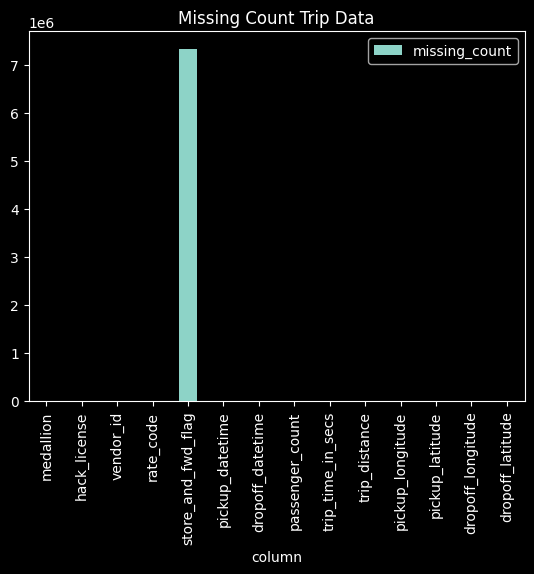

In [31]:
# Trip Dataset
(
    data.isna().sum()
      .reset_index()
      .rename(columns={'index': 'column', 0: 'missing_count'})
      #.assign(missing_percent=lambda x: x['missing_count']/len(data)*100)
      #.sort_values('missing_percent', ascending=False)
).plot(kind="bar", x="column", y="missing_count", title="Missing Count Trip Data")

<Axes: title={'center': 'Missing Count Trip Fares'}, xlabel='column'>

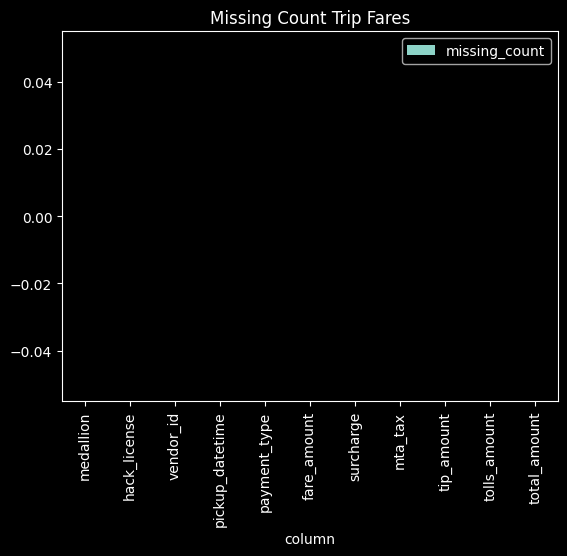

In [32]:
(
    fare.isna().sum()
      .reset_index()
      .rename(columns={'index': 'column', 0: 'missing_count'})
).plot(kind="bar", x="column", y="missing_count", title="Missing Count Trip Fares")

In [84]:
data.isna().mean()

medallion             0.000000
hack_license          0.000000
vendor_id             0.000000
rate_code             0.000000
store_and_fwd_flag    0.495797
pickup_datetime       0.000000
dropoff_datetime      0.000000
passenger_count       0.000000
trip_time_in_secs     0.000000
trip_distance         0.000000
pickup_longitude      0.000000
pickup_latitude       0.000000
dropoff_longitude     0.000006
dropoff_latitude      0.000006
dtype: float64

**Missing Values Observations**


`store_and_fwd_flag`:

- Data field is inserted by the taxi's onboarding system and not sourced by a human user's input
- In NYC Taxi-style systems, the data values:
  - N: record was transmitted live
  - Y: record was stored locally then forwarded later
- Hence, the missing values are not random and reflects on possible errors existing in the data ingestion or ETL processes in sourcing this data field.

**Observation & Analysis**

- All missing values occur conditioned to VTS
- store_and_fwd_flag is typically set by the onboard taxi meter or dispatch system, not the central aggregator.
- This suggests that CMT and VTS may use different hardware and data schemas in the NYC Taxi & Limousine Commission’s data feeds.
- Possible causes as to why VTS did not transmit the variable:

  - Their schema at the time omitted the field.
  - The ingestion script defaulted to NULL during database merge.

**Evaluation**

This finding reveals a schema discrepancy across vendors, not a sensor or network failure and hence, yields the following insights:

- Missingness is predictable and non-random — safe to model around.
- Analyses comparing CMT and VTS directly on this field would be biased unless you account for the missingness.
- It might even indicate a data version boundary in the historical feed — worth cross-checking with the release notes or metadata (NYC TLC schema changed around 2012–2013).
- Missingness is not due to corrupted or lost data from the data source system.


In [52]:
data.groupby('vendor_id')['store_and_fwd_flag'].apply(lambda x: x.isna().mean())

vendor_id
CMT    0.000066
VTS    1.000000
Name: store_and_fwd_flag, dtype: float64

### <a id='toc2_3_2_'></a>[**Outlier Detection**](#toc0_)

- Columns with >5% missingness are worth investigating — especially coordinate or fare fields, which indicate data collection errors.


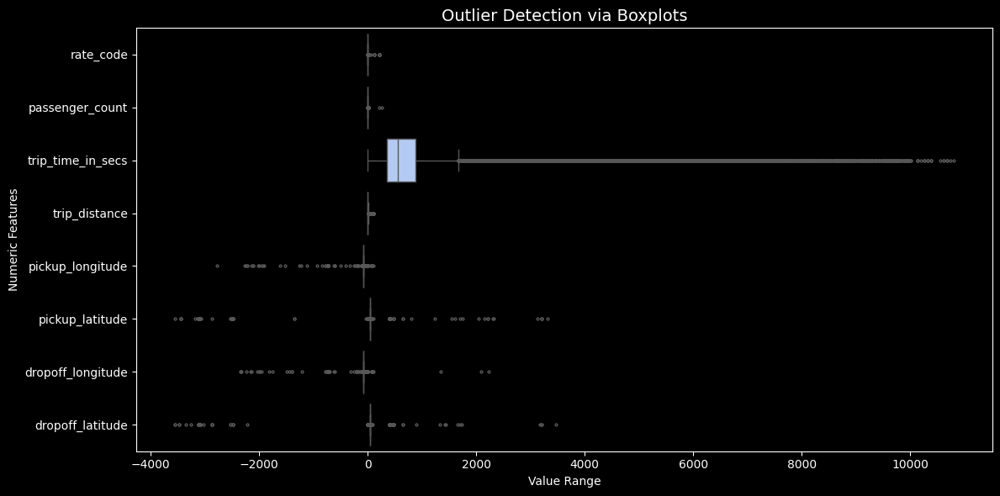

In [33]:
# Trip Data
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = data.select_dtypes(include='number').columns

# Plot boxplots to visualize outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[numeric_cols], orient='h', palette='coolwarm', fliersize=2)
plt.title('Trip Data Outlier Detection Boxplots', fontsize=14)
plt.xlabel('Value Range')
plt.ylabel('Numeric Features')
plt.tight_layout()
plt.show()

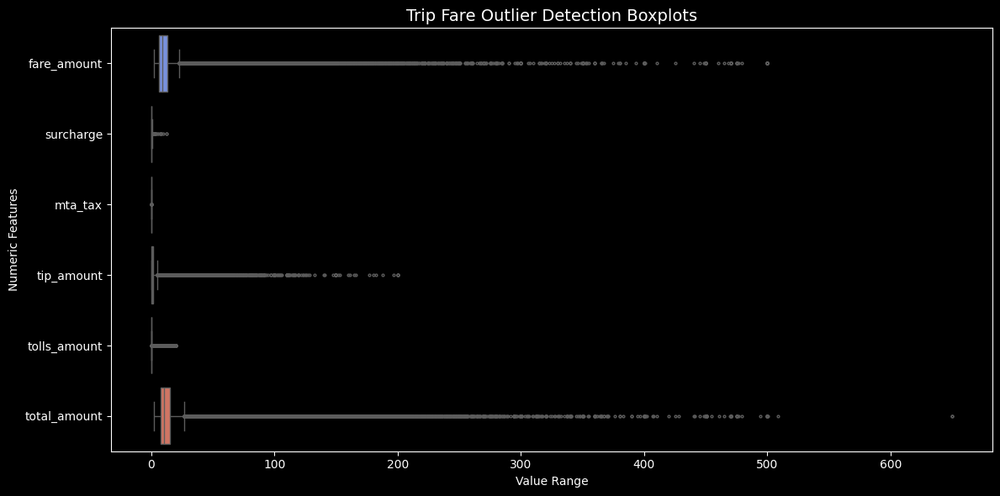

In [37]:
# Trip fares
numeric_cols_fare = fare.select_dtypes(include='number').columns

# Plot boxplots to visualize outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=fare[numeric_cols_fare], orient='h', palette='coolwarm', fliersize=2)
plt.title('Trip Fare Outlier Detection Boxplots', fontsize=14)
plt.xlabel('Value Range')
plt.ylabel('Numeric Features')
plt.tight_layout()
plt.show()

### <a id='toc2_3_3_'></a>[**Coordinate Sanity Map - NYC Bounds Checks**](#toc0_)


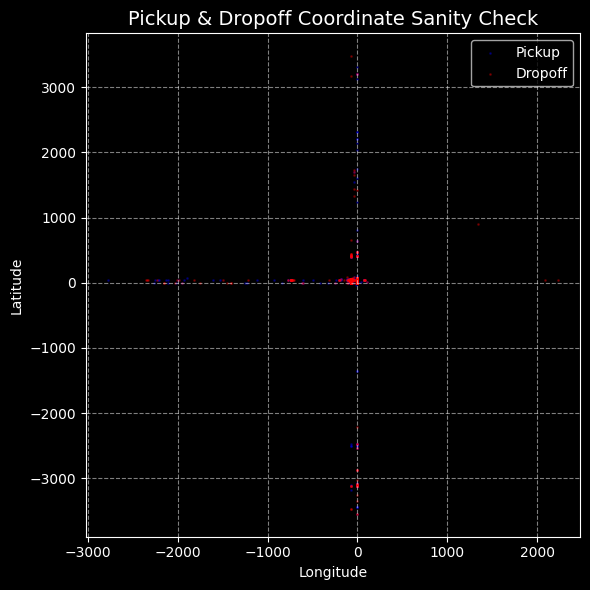

In [35]:
plt.figure(figsize=(6, 6))
plt.scatter(
    data['pickup_longitude'],
    data['pickup_latitude'],
    s=1, alpha=0.3, c='blue', label='Pickup'
)
plt.scatter(
    data['dropoff_longitude'],
    data['dropoff_latitude'],
    s=1, alpha=0.3, c='red', label='Dropoff'
)
plt.title('Pickup & Dropoff Coordinate Sanity Check', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### <a id='toc2_3_4_'></a>[**Correlation Heatmap - Relationship between numerical fields**](#toc0_)


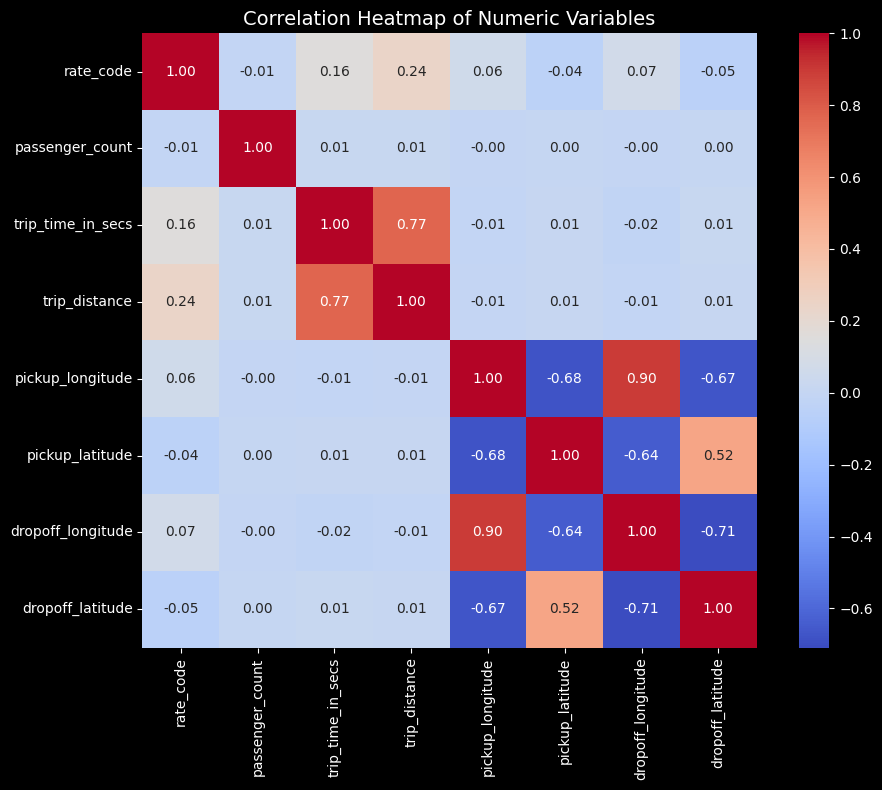

In [36]:
plt.figure(figsize=(10, 8))
corr = data[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Numeric Variables', fontsize=14)
plt.tight_layout()
plt.show()

# <a id='toc3_'></a>[**Data Quality Framework Overview**](#toc0_)

This section outlines the construction of the data quality testing pipeline. Defining the validation logic, thresholds, and causal relationships that ensure the NYC Taxi dataset meets analytical and operational integrity standards. Each subsection describes a distinct stage of reasoning — from defining boundaries to evaluating relationships among key variables.


## <a id='toc3_1_'></a>[**Data Validation Rules & Thresholds**](#toc0_)

This step defines the quantitative and logical thresholds used to evaluate the completeness, consistency, and validity of dataset features.
It combines three critical lenses of analysis:

- Statistical Summary — Evaluates data distribution, central tendencies, and dispersion to identify numerical anomalies or improbable ranges.
- Domain-Specific Reasoning — Incorporates contextual understanding of taxi operations (e.g., a trip cannot have a fare without distance, nor distance without coordinates).
- Cross-Feature Dependencies — Establishes interdependencies among features (e.g., fare amount should correlate positively with trip distance and duration).

The resulting checks provide the structural foundation for automated data validation.


### <a id='toc3_1_1_'></a>[**Statistical Summary**](#toc0_)

This subsection focuses on descriptive statistics for continuous variables such as trip_distance, fare_amount, and passenger_count.
It quantifies thresholds like minimum/maximum valid ranges, median values, and percentile boundaries. These metrics guide the definition of outlier detection rules — ensuring that improbable or erroneous records are systematically captured in the validation pipeline.


In [ ]:
# Statistical Overview of the trip data
data.select_dtypes(include=['number', 'datetime']).describe()
# data.select_dtypes(include=['number', 'datetime']).describe().loc["mean", "rate_code"]

,rate_code,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,1.477662e+07,14776615,14776615,1.477662e+07,1.477662e+07,1.477662e+07,1.477662e+07,1.477662e+07,1.477653e+07,1.477653e+07
mean,1.034273e+00,2013-01-17 00:48:07.364545024,2013-01-17 00:59:32.925766656,1.697372e+00,6.834236e+02,2.770976e+00,-7.263634e+01,4.001440e+01,-7.259443e+01,3.999219e+01
min,0.000000e+00,2013-01-01 00:00:00,2013-01-01 00:00:36,0.000000e+00,0.000000e+00,0.000000e+00,-2.771285e+03,-3.547921e+03,-2.350956e+03,-3.547921e+03
25%,1.000000e+00,2013-01-09 15:31:28.500000,2013-01-09 15:44:00,1.000000e+00,3.600000e+02,1.000000e+00,-7.399188e+01,4.073551e+01,-7.399121e+01,4.073468e+01
50%,1.000000e+00,2013-01-17 08:08:00,2013-01-17 08:20:00,1.000000e+00,5.540000e+02,1.700000e+00,-7.398166e+01,4.075315e+01,-7.398013e+01,4.075362e+01
75%,1.000000e+00,2013-01-24 18:29:00,2013-01-24 18:41:00,2.000000e+00,8.850000e+02,3.060000e+00,-7.396684e+01,4.076729e+01,-7.396390e+01,4.076819e+01
max,2.100000e+02,2013-01-31 23:59:59,2013-02-01 10:33:08,2.550000e+02,1.080000e+04,1.000000e+02,1.124042e+02,3.310365e+03,2.228738e+03,3.477106e+03
std,3.387715e-01,NaN,NaN,1.365396e+00,4.944063e+02,3.305923e+00,1.013819e+01,7.789904e+00,1.028860e+01,7.537067e+00


In [59]:
# Statistical Overview of the trip data
fare.select_dtypes(include=['number', 'datetime']).describe()

,pickup_datetime,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
count,14776615,1.477662e+07,1.477662e+07,1.477662e+07,1.477662e+07,1.477662e+07,1.477662e+07
mean,2013-01-17 00:48:07.364545024,1.166472e+01,3.204904e-01,4.983970e-01,1.267509e+00,2.018670e-01,1.395298e+01
min,2013-01-01 00:00:00,2.500000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.500000e+00
25%,2013-01-09 15:31:28.500000,6.500000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,7.700000e+00
50%,2013-01-17 08:08:00,9.000000e+00,0.000000e+00,5.000000e-01,8.000000e-01,0.000000e+00,1.050000e+01
75%,2013-01-24 18:29:00,1.300000e+01,5.000000e-01,5.000000e-01,2.000000e+00,0.000000e+00,1.550000e+01
max,2013-01-31 23:59:59,5.000000e+02,1.250000e+01,5.000000e-01,2.000000e+02,2.000000e+01,6.500000e+02
std,NaN,9.639219e+00,3.675741e-01,2.826541e-02,2.046084e+00,1.035481e+00,1.146469e+01


### <a id='toc3_1_2_'></a>[**Logical Consistency Checks**](#toc0_)

This segment formalizes causal dependencies between features based on temporal and operational logic.
For example:

- If pickup_datetime exists, corresponding pickup_longitude and pickup_latitude values must also exist.
- If dropoff_datetime exists, corresponding geographic coordinates, trip_distance, and total_amount must be present.

These conditional expectations encode the logical integrity of a taxi trip record — ensuring temporal, spatial, and financial attributes are coherently aligned.
Such reasoning moves beyond simple null checks to enforce real-world plausibility.


### <a id='toc3_1_3_'></a>[**Causal & Cross-Feature Dependencies**](#toc0_)

This section examines cross-feature dependencies and aggregated relationships within the dataset.
By grouping over identifiers such as medallion, hack_license, and vendor_id, the analysis validates business-level consistencies — e.g., verifying that total and average fares align with the number of trips per taxi or driver.
This relational analysis surfaces subtle quality issues like duplicated identifiers, inconsistent fare totals, or anomalies in driver performance metrics.


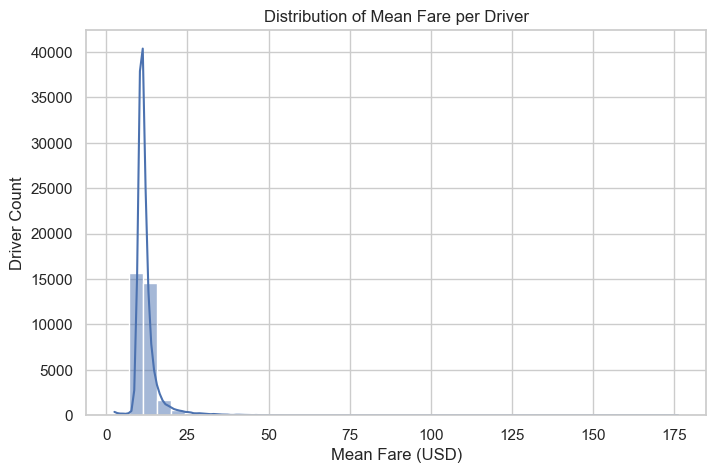

          mean_fare   total_trips
count  33317.000000  33317.000000
mean      12.189203    443.515773
std        3.937382    229.361971
min        2.500000      1.000000
25%       10.500000    271.000000
50%       11.261620    468.000000
75%       12.531707    610.000000
max      176.250000   1933.000000


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", context="notebook")
# =========================================================
# 2. Driver-Level Fare Averages
# =========================================================
driver_fares = (
    fare.groupby(["hack_license", "vendor_id"])
    .agg(mean_fare=("fare_amount", "mean"), total_trips=("fare_amount", "count"))
    .reset_index()
)

plt.figure(figsize=(8, 5))
sns.histplot(driver_fares["mean_fare"], bins=40, kde=True)
plt.title("Distribution of Mean Fare per Driver")
plt.xlabel("Mean Fare (USD)")
plt.ylabel("Driver Count")
plt.show()

print(driver_fares.describe())


Invalid timestamp records: 48


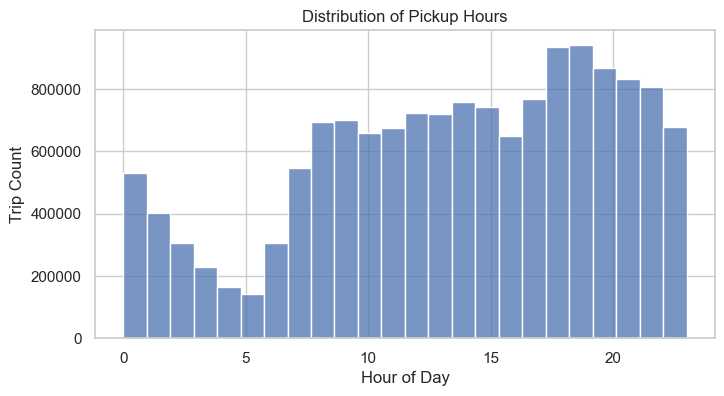

In [54]:
for col in ["pickup_datetime", "dropoff_datetime"]:
    if col in data.columns:
        data[col] = pd.to_datetime(data[col], errors="coerce")

if all(col in data.columns for col in ["pickup_datetime", "dropoff_datetime"]):
    invalid_time = data[data["dropoff_datetime"] < data["pickup_datetime"]]
    print(f"Invalid timestamp records: {len(invalid_time)}")

    plt.figure(figsize=(8, 4))
    sns.histplot(data["pickup_datetime"].dt.hour, bins=24, kde=False)
    plt.title("Distribution of Pickup Hours")
    plt.xlabel("Hour of Day")
    plt.ylabel("Trip Count")
    plt.show()


/var/folders/rc/5ny4rz796d7gqs_j5kcvk6nh0000gn/T/ipykernel_96576/3161336139.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fare.groupby("payment_type")["fare_amount"]
/var/folders/rc/5ny4rz796d7gqs_j5kcvk6nh0000gn/T/ipykernel_96576/3161336139.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


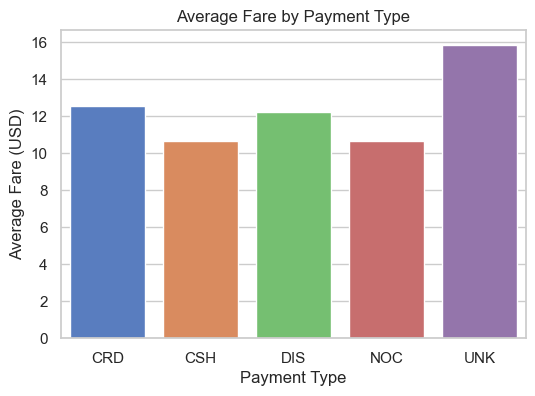

,payment_type,count,mean,sum
0,CRD,7743844,12.560949,97270029.62
1,CSH,6982383,10.670660,74506631.97
2,DIS,11171,12.214351,136446.51
3,NOC,32783,10.673258,349901.42
4,UNK,6434,15.868362,102097.04


In [55]:

# =========================================================
# 6. Payment Type Consistency
# =========================================================
if "payment_type" in fare.columns:
    payment_summary = (
        fare.groupby("payment_type")["fare_amount"]
        .agg(["count", "mean", "sum"])
        .reset_index()
    )

    plt.figure(figsize=(6, 4))
    sns.barplot(
        x="payment_type", y="mean", data=payment_summary,
        palette="muted"
    )
    plt.title("Average Fare by Payment Type")
    plt.xlabel("Payment Type")
    plt.ylabel("Average Fare (USD)")
    plt.show()

    display(payment_summary)

Together, these subsections serve as the quality backbone of the NYC Taxi analysis pipeline. They ensure that downstream analytics — such as fare optimization, efficiency modeling, or cost forecasting — are based on clean, reliable, and causally consistent data.


## <a id='toc3_2_'></a>[**Validation Summary & Reporting**](#toc0_)

To run quality checks for larger samples and support real-time automation processing pipelines the logic is defined in YAML-files for readability and tailored testing framework built on top of Great Expectations (GX) - Python open-source tool.

**Data Quality Scoring based on severity**

The following table is an example of a possible quality scoring logic for this dataset. This acts as the baseline for initiating the calculation of scoring metrics per data column.

| **Data Type / Field**                  | **Extreme (3 points)**                                                                                                                                  | **Mid (2 points)**                                                                           | **Low (1 point)**                                        |
| -------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------- | -------------------------------------------------------- |
| **Unique IDs**                         | - Missing values<br>- Duplicates present (non-unique)                                                                                                   | - Non-consistent formatting (e.g., extra spaces, inconsistent casing)                        | - Valid and unique but no referential integrity check    |
| **Continuous / Measurement Values**    | - Out-of-range or physically impossible values (e.g., negative fares, zero distances)<br>- Extreme frequency of min/max values<br>- Non-numeric symbols | - Heavy skew or kurtosis indicating bias<br>- Inconsistent precision (e.g., rounding errors) | - Small sampling bias or minor rounding issues           |
| **Binary (Y/N, 0/1)**                  | - Non-binary values present (e.g., NaN, 2, “Maybe”)                                                                                                     | - Missing or inconsistent capitalization (“y”, “N”)                                          | - Small imbalance between classes                        |
| **Multi-class / Categorical**          | - Invalid or unknown category labels<br>- High-cardinality unexpected fields                                                                            | - Non-standard spelling, encoding differences, or missing labels                             | - Minor imbalance in category frequency                  |
| **Datetime / Timestamp**               | - Non-parseable or invalid formats<br>- Negative or zero time deltas (dropoff < pickup)                                                                 | - Timezone inconsistency or missing timezone info<br>- Ambiguous formatting (MM/DD vs DD/MM) | - Duplicate timestamps but plausible                     |
| **Vector / Array / Structured Fields** | - Corrupted format (e.g., JSON decoding errors)<br>- Wrong dimensionality                                                                               | - Missing elements or inconsistent length                                                    | - Slightly inconsistent ordering or rounding differences |


### <a id='toc3_2_1_'></a>[**Data Quality Scoring Framework**](#toc0_)

The scoring framework quantifies dataset reliability by combining both _dimensional quality measures_ and _severity-based penalties_ into a unified index. These are then used to stream metrics on Quality Testing dashboards.

- **Data Quality Score:**  
  Each column or field is assigned a score based on two weighted components:

  1. $x_{\text{dimension\_layer}}$: Score derived from the quality dimension layer — such as completeness, validity, consistency, or accuracy.
  2. $x_{\text{severity\_count}}$: Score determined by the count and intensity of failed checks.

  The composite data quality score for a given field is defined as:

  $$DQ_{\text{field}} = \lambda_0 \times x_{\text{dimension\_layer}} + \lambda_1 \times x_{\text{severity\_count}}$$

  where $\lambda_0$ and $\lambda_1$ are scaling constants calibrated according to domain sensitivity and operational insights  
  (e.g., monetary or time-based fields may carry higher $\lambda_1$ weights).

- **Overall Data Quality Score:**  
  The global dataset quality index is computed as the mean of all individual field-level scores, providing an interpretable measure of the dataset’s overall health.
